In [2]:
import numpy as np
import anndata as ann
import pandas as pd
import scanpy as sc
import scvelo as scv
import scipy as sp
import matplotlib.pyplot as pl
import matplotlib.pylab as pit
import leidenalg
import bbknn
import seaborn as sb
import scrublet as scr
from IPython.core.display import display, HTML
from matplotlib import rcParams

In [3]:
adata=sc.read('/Users/stefanie_baerthel/scRNA-seq/scRNAseq_analysis/Treatment/data/Overlay_treatment_preprocessing_t_cells_bbknn_V01-sb.h5ad')

In [4]:
file_path = '/Users/stefanie_baerthel/scRNA-seq/scRNAseq_analysis/Treatment/'

In [5]:
sc.settings.figdir = file_path + '/figures/'

In [6]:
sc.settings.set_figure_params(dpi=120, dpi_save=300, vector_friendly=True, transparent=True, color_map='viridis')

In [7]:
sc.tl.leiden(adata, resolution=1.8) 

## Identifying populations

Markers obtained from Zhang et al., Cancer Cell, 2020

### CD4+ cells

Classified as naive T cells cells presenting: high levels of Cd4 and the naive T cell marker Sell (CD62L), but lacked the expression of effector/memory T cells marker Cd44 and T cell activation genes, including Ifng, Icos, Lag3, Havcr2 (Tim-3), Pdcd1, Tnfrsf4 and Ctla4

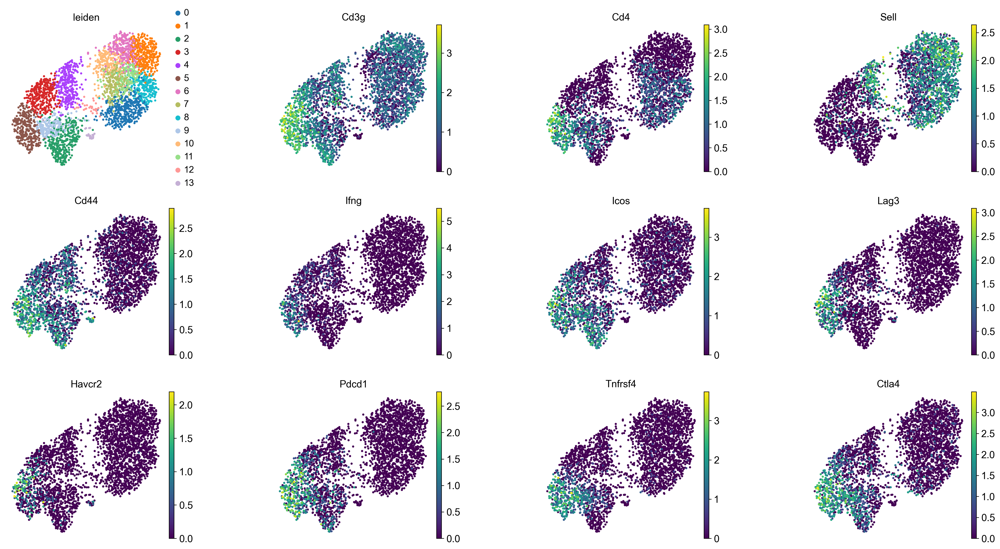

In [9]:
sc.pl.umap(adata, 
           color=['leiden','Cd3g','Cd4','Sell','Cd44','Ifng','Icos','Lag3','Havcr2','Pdcd1','Tnfrsf4','Ctla4'], 
           ncols=4, frameon=False, wspace=0.5) 

#### Activated/effector T cells

Activated/effector T cell signature defined as high levels of Icos, Tim-3, Ctla4 and Pdcd1, and intermediate levels Cd44

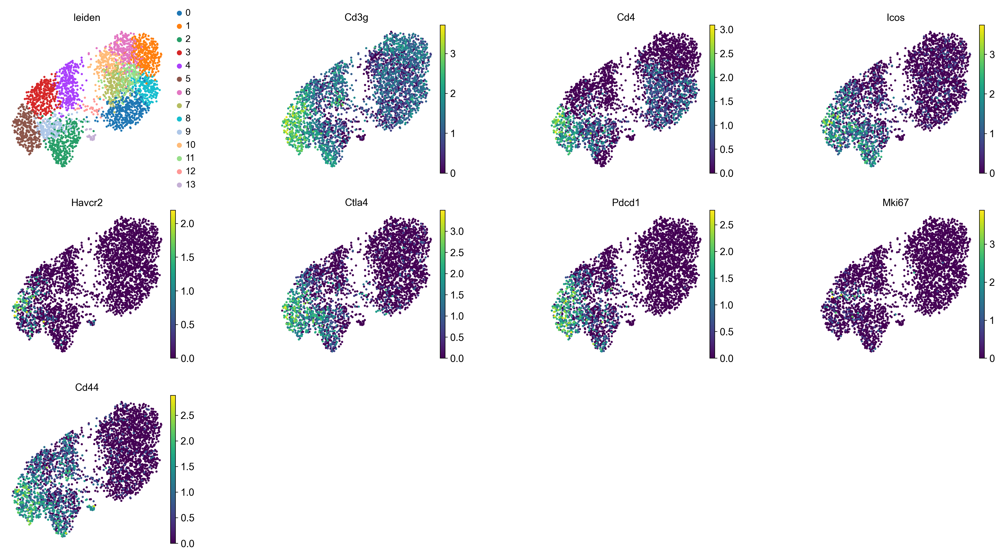

In [10]:
sc.pl.umap(adata, 
           color=['leiden','Cd3g','Cd4','Icos','Havcr2','Ctla4','Pdcd1','Mki67','Cd44'], 
           ncols=4, wspace=0.5, frameon=False) 

#### Regulatory T cells

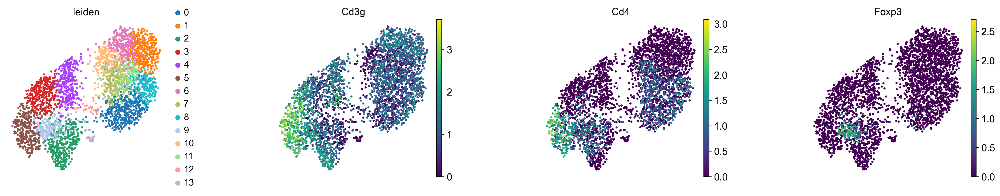

In [11]:
sc.pl.umap(adata, 
           color=['leiden','Cd3g','Cd4','Foxp3'], 
           ncols=4, wspace=0.5, frameon=False) 

#### Central memory T cells
Defined as: CD3+, CD4+/CD8+, CD27+, CD28+, CD44+, CD57– (B3gat1), CD62L+ (L-Selectin), CD69+/–, CD127+ (Il7r), CD197+ (CCR7)

In [ ]:
sc.pl.umap(adata, 
           color=['leiden','batch','Cd3g','Cd4','Cd8a','Cd44','Cd27','Cd28','Cd69','Sell', 'Il7r','Ccr7'], 
           ncols=4, wspace=0.5, frameon=False) 

# B3gat1 - not expressed

#### Effector memory T cells

CD3+, CD4+/CD8+ CD27+/–, CD28+/–, CD44+, CD57+ (B3gat1), CD62L– (L-Selectin), CD69+/–, CD127+/–, CD197- (CCR7)

In [ ]:
sc.pl.umap(adata, 
           color=['leiden','Cd3g','Cd4','Cd8a','Cd27','Cd28','Cd44','Sell','Cd69','Il7r','Ccr7'],frameon=False, 
           ncols=4, wspace=0.5)

#### Tissue resident memory T cells

In [ ]:
sc.pl.umap(adata, 
           color=['leiden','Cd3g','Cd4','Cd8a','Cx3cr1','Itgae','Cxcr6','Cd101','Myb'], 
           ncols=4, wspace=0.5, frameon=False)

### CD8+ cells

#### Naive-like, inactivated state cells

intermediate level of Sell and relatively low levels of the T cell activation genes

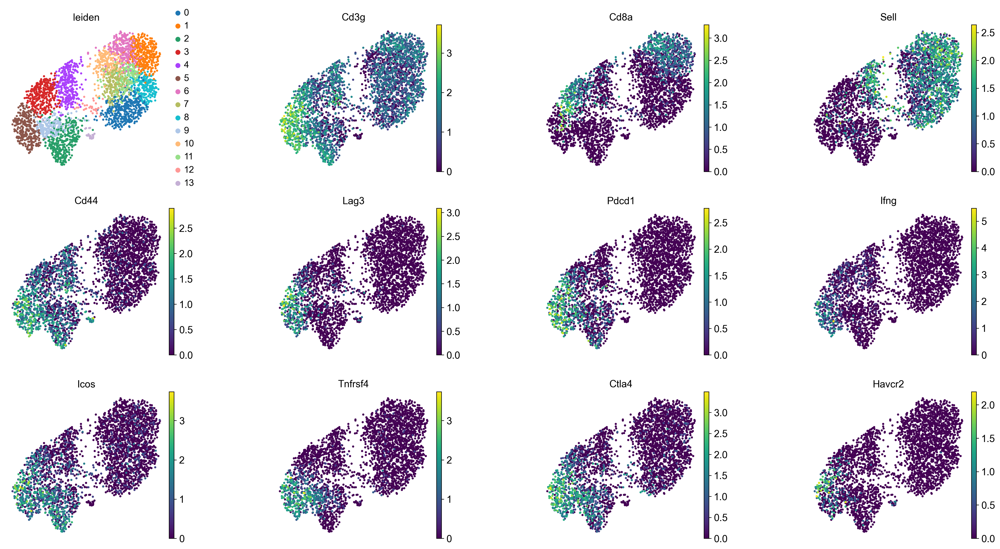

In [17]:
sc.pl.umap(adata, 
           color=['leiden','Cd3g','Cd8a','Sell','Cd44','Lag3','Pdcd1','Ifng','Icos','Tnfrsf4','Ctla4','Havcr2'], 
           ncols=4, wspace=0.5, frameon=False) 

#### ‘‘memory’’ population with cytotoxicity and low proliferation capability

high levels of Cd8a and memory T cell marker Klrg1, intermediate levels of cytotoxic T cells marker Gzma and Gzmb, and intermediate levels of two central T cell differentiation genes Tbx21 (T-bet) and Eomes

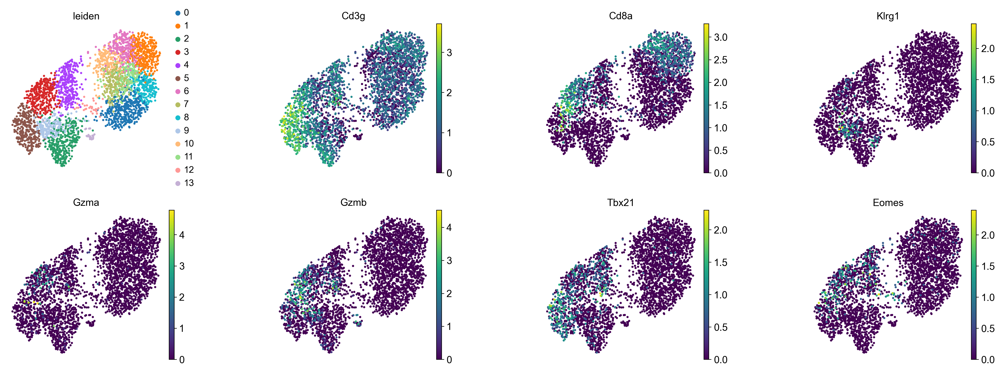

In [18]:
sc.pl.umap(adata, 
           color=['leiden','Cd3g','Cd8a','Klrg1','Gzma','Gzmb','Tbx21','Eomes'], 
           ncols=4, wspace=0.5, frameon=False) 

#### Cytotoxic T cells

the highest levels of T cell activation genes Lag3, Tim-3, Pdcd1, Tnfrsf18 and Ifng, and cytotoxic markers Gzma, Gzmb and Prf1

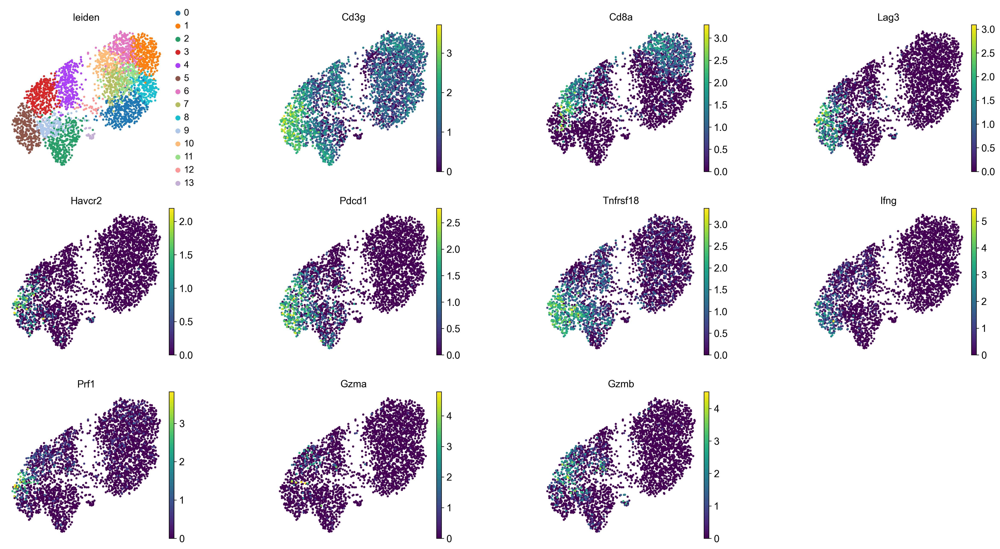

In [19]:
sc.pl.umap(adata, 
           color=['leiden','Cd3g','Cd8a','Lag3','Havcr2','Pdcd1','Tnfrsf18','Ifng','Prf1','Gzma','Gzmb'], 
           ncols=4, wspace=0.5, frameon=False) 

#### ‘‘effector’’ T cells

low levels of Sell but high levels of effector T cell marker Cd44 and activation markers Icos, Ctla4 and Tnfrsf4, representing an ‘‘effector’’ T cell signature

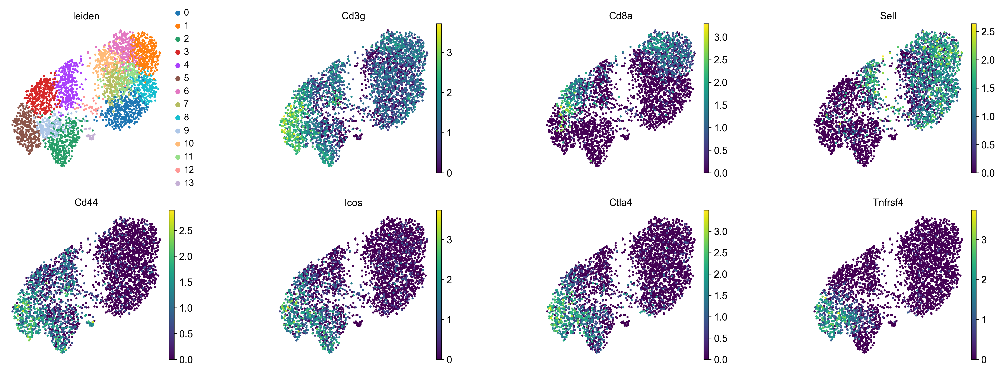

In [20]:
sc.pl.umap(adata, 
           color=['leiden','Cd3g','Cd8a','Sell','Cd44','Icos','Ctla4','Tnfrsf4'], 
           ncols=4, wspace=0.5, frameon=False)

In [54]:
sc.tl.rank_genes_groups(adata, 'leiden', n_genes=30, use_raw=True)

In [ ]:
sc.pl.rank_genes_groups(adata)

## Cluster annotation

In [65]:
adata.obs['annotated'] = adata.obs['leiden'].cat.add_categories(['effector T cells',
                                                                'cytotoxic T cells',
                                                                'CD4+ T cells',
                                                                'CD8+ T cells',
                                                                'central memory T cells',
                                                                'regulatory T cells'])

adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['5','2','13'])] = 'effector T cells'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['3'])] = 'cytotoxic T cells'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['0','8','11','7','10'])] = 'CD4+ T cells'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['1','6'])] = 'CD8+ T cells'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['4','12'])] = 'central memory T cells'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['9'])] = 'regulatory T cells'

adata.obs['annotated'] = adata.obs['annotated'].cat.remove_unused_categories()


In [69]:
adata.obs['samples'] = adata.obs['batch'].cat.add_categories(['classical','mesenchymal'])

adata.obs['samples'][np.in1d(adata.obs['samples'], ["a.8661 ctrl", "a.8661 T/N", "a.8661 T/N+aPDL1", "b.8661 ctrl", "b.8661 T/N", "b.8661 T/N+aPDL1"])] = 'classical'
adata.obs['samples'][np.in1d(adata.obs['samples'], ["a.9091 ctrl", "a.9091 T/N", "a.9091 T/N+aPDL1_1","a.9091 T/N+aPDL1_2", "b.9091 ctrl", 
                       "b.9091 T/N", "b.9091 T/N+aPDL1_1", "b.9091 T/N+aPDL1_2"])] = 'mesenchymal'



adata.obs['samples'] = adata.obs['samples'].cat.remove_unused_categories()

In [66]:
Paired2=[[0.65098039, 0.80784314, 0.89019608, 1.],
[0.69803922, 0.8745098, 0.54117647, 1.],
[0.99215686, 0.74901961, 0.43529412, 1.],
[1., 0.49803922, 0., 1.],
[0.41568627, 0.23921569, 0.60392157, 1.],
[0.69411765, 0.34901961, 0.15686275, 1.]]

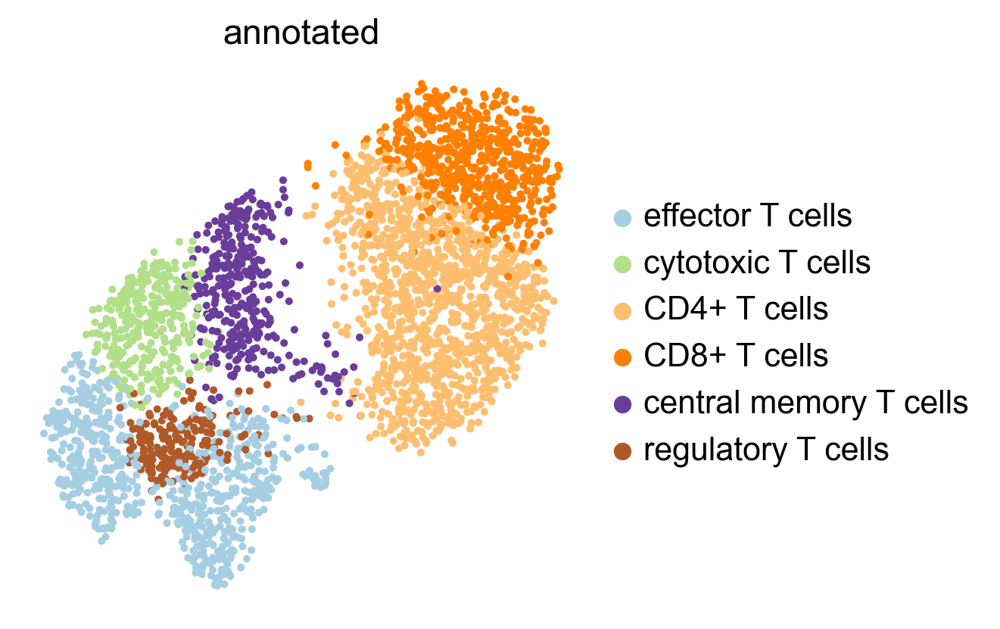

In [72]:
sc.pl.umap(adata, color=['annotated'], ncols=3, wspace=0.7, palette=Paired2, save='_annotation',frameon=False)

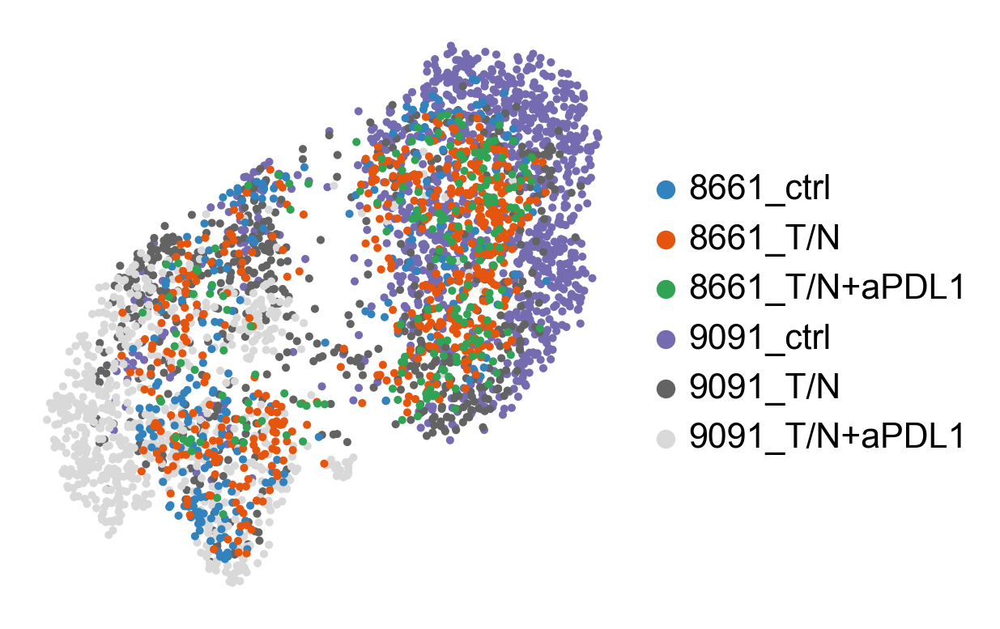

In [78]:
sc.pl.umap(adata, color='samples2', title='', palette='tab20c', frameon=False, save='batch')